In [1]:
from pathlib import Path
from copy import deepcopy

import NegativeClassOptimization.config as config
import NegativeClassOptimization.datasets as datasets
from NegativeClassOptimization.preprocessing import onehot_encode_df

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import metrics
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler
from sklearn.preprocessing import StandardScaler
import torch.optim as optim
from tqdm.notebook import tqdm
from ipywidgets import FloatProgress
import math
import json
import glob
import re

In [2]:
from modif_utils import *

In [3]:
class SN10_stab(nn.Module):

    def __init__(self, normalize=False):
        super(SN10_stab, self).__init__()
        self.flatten = nn.Flatten()
        self.linear1 = nn.Linear(11*20, 10)
        nn.init.kaiming_normal_(self.linear1.weight)
        self.linear_relu_stack = nn.Sequential(
            self.linear1,
            nn.ReLU(),
            nn.Linear(10, 1),
        )
        self.normalize = normalize 
        if self.normalize:
            self.norm = UnitNormLayer()
        self.sigmoid = nn.Sigmoid()

    def forward_logits(self, x: torch.Tensor) -> torch.Tensor:
        x = self.flatten(x)
        logits = self.linear_relu_stack(x)
        return logits

    def forward(
        self, 
        x: torch.Tensor, 
        return_logits = False
        ):
        logits = self.forward_logits(x)
        if self.normalize:
            logits = self.norm(logits)
        expits = self.sigmoid(logits)
        if return_logits:
            return expits, logits
        else:
            return expits

In [4]:
def train_model_swa(model, device, train_loader, val_loader, saving_folder, file_name, epochs=200, learning_rate = 0.002,\
                    momentum = 0, weight_decay = 0.001, patience = 10, min_delta = 0.005, swa_lr = 0.002, swa_start = 3):

    baseline_model = model.to(device)

    optimizer = torch.optim.Adam(
                baseline_model.parameters(), 
                lr=learning_rate,
                weight_decay=weight_decay,
                )
    loss_fn = nn.BCELoss()
    swa_model = torch.optim.swa_utils.AveragedModel(baseline_model)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=30)
    swa_start = swa_start
    swa_scheduler = optim.swa_utils.SWALR(optimizer, swa_lr = swa_lr)
    #epochs =40
    train_losses = []
    val_losses = []
    for epoch in tqdm(range(epochs), desc="Epochs", leave = False):
        #train
        running_loss_train= []
        for batch, (X, y) in enumerate(tqdm(train_loader, desc="Training", leave=False)):
            X = X.to(device)
            y = y.to(device)
            y_pred, logits = baseline_model(X, return_logits = True)
            loss = loss_fn(y_pred, y)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            running_loss_train.append(loss.cpu().detach().numpy())
        
        train_loss = np.mean(running_loss_train)
        train_losses.append(float(train_loss))
            
        if epoch > swa_start:
            swa_model.update_parameters(baseline_model)
            swa_scheduler.step()
            val_model = swa_model
        else:
            scheduler.step()
            val_model = baseline_model



        #validation
        running_loss = []
        with torch.no_grad():
            validation_loss = []
            for batch, (X,y) in enumerate(tqdm(val_loader, desc="Validation", leave=False)):
                X = X.to(device)
                y = y.to(device)
                y_pred = val_model(X)
                running_loss.append(loss_fn(y_pred, y).cpu().detach().numpy())
            val_loss = np.mean(running_loss) 
            val_losses.append(float(val_loss))
            
        #print(f"Epoch: {epoch+1}/{epochs} - Train loss: {train_loss}, Validation loss: {val_loss}") #save to log-file
        if len(val_losses) >= patience:
            last_losses = val_losses[-patience:]
            max_loss = max(last_losses)
            min_loss = min(last_losses)
            if min_loss + min_delta >= max_loss:
                print("Early stopping") #save-to log file
                break
    
    torch.optim.swa_utils.update_bn(train_loader, swa_model)
    torch.save(swa_model.state_dict(), f'./torch_models/{saving_folder}/{file_name}_swa.pt')
    torch.save(swa_model.state_dict(), f'./torch_models/{saving_folder}/{file_name}_baseline.pt')
    with open(f'./logs/{file_name}_train_val_losses.json', 'w') as f:
        json.dump([train_losses, val_losses], f)



In [14]:
one_vs_mix_paths = glob.glob(str(Path(ONE_VS_MIX_ALL_PATH)) + "/[0-9A-Z]*")

In [16]:
replicates = 10
batch_size = 100
for dataset in tqdm(one_vs_mix_paths, desc = 'Models'):
    file = dataset.split('/')[-1].strip('.tsv')
    df = pd.read_csv(dataset, sep='\t')
    train, val,  test = train_val_test_prep(df, scale = False)
    train_loader = DataLoader(train, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val, batch_size=batch_size, shuffle=True)
    #test_loader = DataLoader(test, batch_size=batch_size, shuffle=True)
    for i in tqdm(range(1, replicates+1), desc = 'replicates', leave = False):
        device = "mps" if torch.backends.mps.is_available() else "cpu"
        model = SN10_stab().to(device)
        train_model_swa(model, device, train_loader, val_loader, 'SN10_one_vs_mix', file + f'_repl_{i}')

  

Models:   0%|          | 0/10 [00:00<?, ?it/s]

replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Training:   0%|          | 0/268 [00:00<?, ?it/s]

Validation:   0%|          | 0/67 [00:00<?, ?it/s]

Early stopping


In [5]:
models_folder = 'SN10_one_vs_mix'
fstr_file = 'vs_mix_allrepl_[0-9]*_swa.pt'
list_4_df = []

for ag in antigens:
    models = glob.glob(f'./torch_models/{models_folder}/{ag}_{fstr_file}')
    open_path = HIGH_LOW_PATH / f'{ag}_high_low.tsv' 
    closed_path = ONE_VS_MIX_ALL_PATH / f'{ag}_vs_mix_all.tsv'
    open_dataloader, closed_dataloader = get_open_closed_dataloader(open_path, closed_path)
    for model_path in models:
        
        #model definition !CHANGABLE
        device = 'cpu'
        base_model = SN10_stab()
        swa_model = torch.optim.swa_utils.AveragedModel(base_model)
        swa_model.load_state_dict(torch.load(model_path))
        swa_model = swa_model.to(device)
        #get repl number
        repl = model_path.split('/')[-1]
        repl = re.search('\.*repl_(\d*)', repl).group(1)
        
        open_performance, closed_performance = get_open_closed_perf(swa_model, open_dataloader, closed_dataloader)
        list_4_df.append([ag, 'open', repl] + open_performance)
        list_4_df.append([ag, 'closed', repl] + closed_performance)

performance_df = pd.DataFrame(list_4_df, columns = ['ag', 'test type', 'repl'] +['loss', 'acc', 'recall', 'prec', 'f1'])

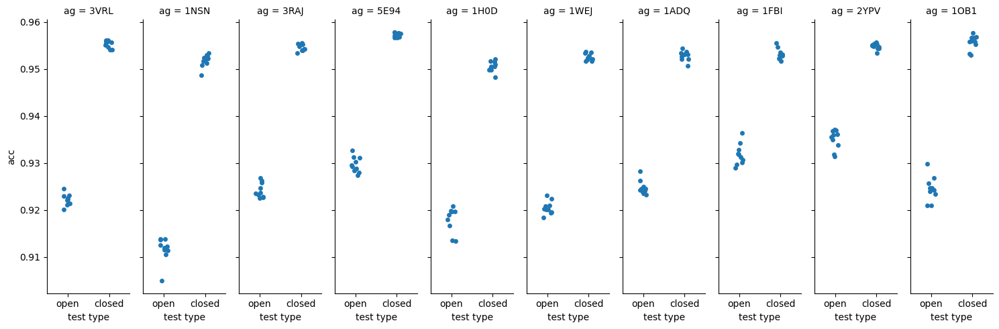

In [6]:
sns.catplot(performance_df, x ='test type', y ='acc', col='ag', aspect=0.3)

In [ ]:
#this means i can imprve open set performance by fine-tuning model, teaching a bit more

In [7]:
one_vs_all_paths = glob.glob(str(Path(ONE_VS_ALL_PATH)) + "/[0-9A-Z]*")

In [8]:
replicates = 10
batch_size = 100
for dataset in tqdm(one_vs_all_paths, desc = 'Models'):
    file = dataset.split('/')[-1].strip('.tsv')
    df = pd.read_csv(dataset, sep='\t')
    train, val,  test = train_val_test_prep(df, scale = False)
    train_loader = DataLoader(train, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val, batch_size=batch_size, shuffle=True)
    #test_loader = DataLoader(test, batch_size=batch_size, shuffle=True)
    for i in tqdm(range(1, replicates+1), desc = 'replicates', leave = False):
        device = "mps" if torch.backends.mps.is_available() else "cpu"
        model = SN10_stab().to(device)
        train_model_swa(model, device, train_loader, val_loader, 'SN10_1_vs_all', file + f'_repl_{i}')

  

Models:   0%|          | 0/10 [00:00<?, ?it/s]

replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Training:   0%|          | 0/290 [00:00<?, ?it/s]

Validation:   0%|          | 0/73 [00:00<?, ?it/s]

Early stopping


In [14]:
high_95low_paths = glob.glob(str(Path(HIGH_LOW_PATH)) + "/[0-9A-Z]*_high_95*")

In [16]:
replicates = 10
batch_size = 100
for dataset in tqdm(high_95low_paths, desc = 'Models'):
    file = dataset.split('/')[-1].strip('.tsv')
    df = pd.read_csv(dataset, sep='\t')
    train, val,  test = train_val_test_prep(df, scale = False)
    train_loader = DataLoader(train, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val, batch_size=batch_size, shuffle=True)
    #test_loader = DataLoader(test, batch_size=batch_size, shuffle=True)
    for i in tqdm(range(1, replicates+1), desc = 'replicates', leave = False):
        device = "mps" if torch.backends.mps.is_available() else "cpu"
        model = SN10_stab().to(device)
        train_model_swa(model, device, train_loader, val_loader, 'SN10_high_low', file + f'_repl_{i}')

  

Models:   0%|          | 0/10 [00:00<?, ?it/s]

replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


In [17]:
high_looser_paths = glob.glob(str(Path(HIGH_LOW_PATH)) + "/[0-9A-Z]*_high_looser*")

In [18]:
replicates = 10
batch_size = 100
for dataset in tqdm(high_looser_paths, desc = 'Models'):
    file = dataset.split('/')[-1].strip('.tsv')
    df = pd.read_csv(dataset, sep='\t')
    train, val,  test = train_val_test_prep(df, scale = False)
    train_loader = DataLoader(train, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val, batch_size=batch_size, shuffle=True)
    #test_loader = DataLoader(test, batch_size=batch_size, shuffle=True)
    for i in tqdm(range(1, replicates+1), desc = 'replicates', leave = False):
        device = "mps" if torch.backends.mps.is_available() else "cpu"
        model = SN10_stab().to(device)
        train_model_swa(model, device, train_loader, val_loader, 'SN10_high_low', file + f'_repl_{i}')

  

Models:   0%|          | 0/10 [00:00<?, ?it/s]

replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


In [5]:
pairwise_high_paths = glob.glob(str(Path(PAIRWISE_HIGH_PATH)) + "/[0-9A-Z]*")

In [ ]:
replicates = 10
batch_size = 100
for dataset in tqdm(pairwise_high_paths, desc = 'Models'):
    file = dataset.split('/')[-1].strip('.tsv')
    df = pd.read_csv(dataset, sep='\t')
    train, val,  test = train_val_test_prep(df, scale = False)
    train_loader = DataLoader(train, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val, batch_size=batch_size, shuffle=True)
    #test_loader = DataLoader(test, batch_size=batch_size, shuffle=True)
    for i in tqdm(range(1, replicates+1), desc = 'replicates', leave = False):
        device = "mps" if torch.backends.mps.is_available() else "cpu"
        model = SN10_stab().to(device)
        train_model_swa(model, device, train_loader, val_loader, 'SN10_pw_high', file + f'_repl_{i}')

  

Models:   0%|          | 0/90 [00:00<?, ?it/s]

replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


replicates:   0%|          | 0/10 [00:00<?, ?it/s]

Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Early stopping


Epochs:   0%|          | 0/200 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

Validation:   0%|          | 0/69 [00:00<?, ?it/s]

Training:   0%|          | 0/275 [00:00<?, ?it/s]

In [8]:
device

'mps'

In [1]:
train

NameError: name 'train' is not defined